# My Data Science Project

## Link to my Github repo: https://github.com/cschlons/DTSA-5509-Final/tree/main

### For my final project I decided to look to Kaggle for a dataset to do a project on. My first thoughts were to look to a health related problem. This lead to thinking about a binary classification problem like determing whether a tumor is cancerous or benign.
### I then found the dataset on water quality. This kind of problem is very important, in that there are places all around the world and even in the USA where they don't have clean drinking water. It is important to determine whether or not the water is drinkable. In this dataset, there is information on the different types of minerals and elements in the water that could affect whether it is safe to drink. In this project I will perform exploratory data analysis, clean the data, visualize the data to better understand it, and apply several machine learning algorithms to the data to classify if the water is safe to drink.

In [1]:
import pandas as pd
import numpy as np
import sklearn
import matplotlib.pyplot as plt
import seaborn as sn
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)


Bad key "text.kerning_factor" on line 4 in
g:\Anaconda\envs\bayesenv\lib\site-packages\matplotlib\mpl-data\stylelib\_classic_test_patch.mplstyle.
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.1.2/matplotlibrc.template
or from the matplotlib source distribution


In [60]:
# Link to the dataset on Kaggle: https://www.kaggle.com/datasets/mssmartypants/water-quality
# Citation: MSSMARTYPANTS. (2021). Water Quality. Retreived 12/8/2023 from https://www.kaggle.com/datasets/mssmartypants/water-quality/data.
df = pd.read_csv('waterQuality1.csv')

### First off I will look at the data and determine whether or not I need to clean the data in any ways.
### The is_safe values are 0 for unsafe and 1 for safe to drink. Other measurements in mg/l

In [61]:
df.head()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1


In [62]:
df.shape

(7999, 21)

### In this next block few blocks of code, I counted the number of Nan values in the dataset. There were only three and they existed in the Ammonia feature. Since there were so few in a dataset with almost 8000 indices, I just removed the elements
### After this, I checked the info of the data and found that Ammonia and is_safe columns were not properly defined and were labelled as objects. I need these features to be numerical, so the next step was to cast them to numerical values.

In [63]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7999 entries, 0 to 7998
Data columns (total 21 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   aluminium    7999 non-null   float64
 1   ammonia      7999 non-null   object 
 2   arsenic      7999 non-null   float64
 3   barium       7999 non-null   float64
 4   cadmium      7999 non-null   float64
 5   chloramine   7999 non-null   float64
 6   chromium     7999 non-null   float64
 7   copper       7999 non-null   float64
 8   flouride     7999 non-null   float64
 9   bacteria     7999 non-null   float64
 10  viruses      7999 non-null   float64
 11  lead         7999 non-null   float64
 12  nitrates     7999 non-null   float64
 13  nitrites     7999 non-null   float64
 14  mercury      7999 non-null   float64
 15  perchlorate  7999 non-null   float64
 16  radium       7999 non-null   float64
 17  selenium     7999 non-null   float64
 18  silver       7999 non-null   float64
 19  uraniu

In [64]:
df['ammonia'] = pd.to_numeric(df['ammonia'], errors='coerce')
df['is_safe'] = pd.to_numeric(df['is_safe'], errors='coerce')

In [65]:
for each in df.columns:
    print(each, df[each].isna().sum())

aluminium 0
ammonia 3
arsenic 0
barium 0
cadmium 0
chloramine 0
chromium 0
copper 0
flouride 0
bacteria 0
viruses 0
lead 0
nitrates 0
nitrites 0
mercury 0
perchlorate 0
radium 0
selenium 0
silver 0
uranium 0
is_safe 3


In [66]:
# Drop NA values
df = df.dropna(how='any')

### Now that the data is clean, I can look at the statistics of the data.
### I also noticed that the dependant variable, is_safe, has a mean of 0.114057. This means that there are many more 0s than there are 1s in the data. This means that there are many more datapoints of not safe (0) water than safe (1) water. For this reason, I will split the data in a way that allows for both the training and test sets to contain an equal fraction of 0s and 1s.

In [67]:
df.describe()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
count,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,...,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000
mean,0.666396,14.278212,0.161477,1.567928,0.042803,2.177589,0.247300,0.805940,0.771646,0.319714,...,0.099431,9.819250,1.329846,0.005193,16.465266,2.920106,0.049684,0.147811,0.044672,0.114057
std,1.265323,8.878930,0.252632,1.216227,0.036049,2.567210,0.270663,0.653595,0.435423,0.329497,...,0.058169,5.541977,0.573271,0.002967,17.688827,2.322805,0.028773,0.143569,0.026906,0.317900
min,0.000000,-0.080000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,6.577500,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.407500,0.000000,...,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000,0.000000
50%,0.070000,14.130000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,...,0.102000,9.930000,1.420000,0.005000,7.745000,2.410000,0.050000,0.080000,0.050000,0.000000
75%,0.280000,22.132500,0.100000,2.482500,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,...,0.151000,14.610000,1.760000,0.008000,29.487500,4.670000,0.070000,0.240000,0.070000,0.000000
max,5.050000,29.840000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,...,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000,1.000000


In [68]:
# Drop Ammonia due to ammonia only being dangerous if greater than 32.5 mg/l* and the max is only 29.84
# * Information provided by the Kaggle dataset.
# This was verified by https://www.oregon.gov/oha/PH/HEALTHYENVIRONMENTS/DRINKINGWATER/MONITORING/Documents/health/ammonia.pdf
df = df.drop('ammonia', axis=1)

### Up next, I am looking at the correlation matrix for the data. Here I see that there is not a lot of linear correlation between the data points. There is some among the features such as Perchlorate has medium correlation to Chloramine and Chromium. This may not be worthy of insignificance, but it is worth checking whether or not the model does better with only one of these features instead of all three.
### The features do not share much correlation to the dependant variable, is_safe. The largest correlation is with Aluminum which is a 0.33. Even though the correlations are small, this does not necessarily mean much. This could just mean that the relationship between the features and is_safe is just not linear. For the next graph, I will look at the pairplot.

'\nPerchlorate has a medium correlation to Chloramine and Chromium\nThe dependant variable, is_safe, shows some correlation to a few variables: Cadmium, Aluminum, Chloramine, and Chromium\nIt is possible that there is not a linear relationship between the independant variables and the dependant variable.\nFor this reason, I am thinking that SVC, Boosting, and a Random Forest will do better than just logistic regression.\n'

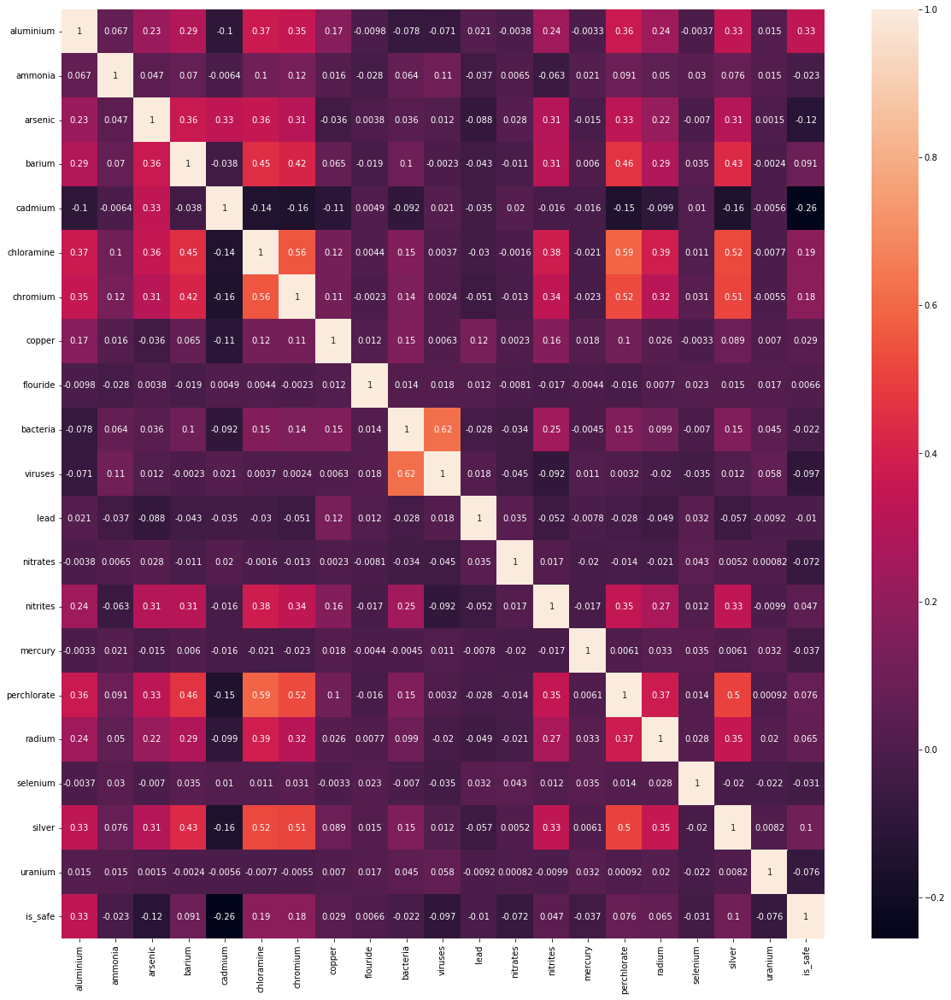

In [9]:
fig, ax = plt.subplots(figsize=(20,20))
sn.heatmap(df.corr(), annot=True, ax=ax)

'''
Perchlorate has a medium correlation to Chloramine and Chromium
The dependant variable, is_safe, shows some correlation to a few variables: Cadmium, Aluminum, Chloramine, and Chromium
It is possible that there is not a linear relationship between the independant variables and the dependant variable.
For this reason, I am thinking that SVC, Boosting, and a Random Forest will do better than just logistic regression.
'''

### For this next plot, I am looking at the pairplot. Since the features didn't share much of a linear relationship with is_safe, this pairplot might tell me more about other relationships.

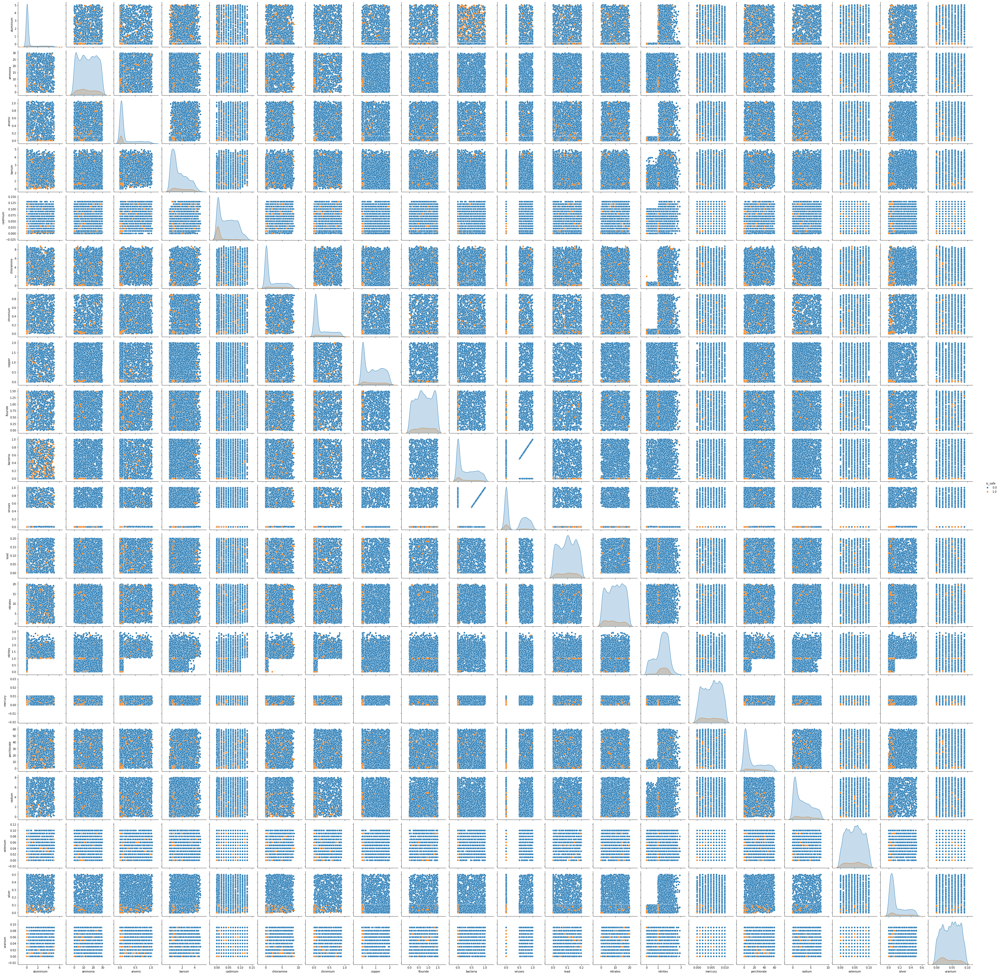

In [10]:
sn.pairplot(df, hue='is_safe', kind='kde')

In [9]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC

### This next block of code splits the data evenly so that there is the same ratio of 0s and 1s in the training and test data.
### The following block of code just uses train_test_split from sklearn to split the data.
### I will use both with the algorithms and compare their accuracy.

In [10]:
df_0 = df[df['is_safe'] == 0.0]
df_1 = df[df['is_safe'] == 1.0]

# Split 80/20
print(df_0.shape[0]*0.8)
print(df_1.shape[0]*0.8)

# 0 to 5667 and 0 to 729
df_0_train = df_0[0:5667]
df_1_train = df_1[0:729]
df_0_test = df_0[5667:]
df_1_test = df_1[729:]

df_train = pd.concat((df_0_train,df_1_train), ignore_index=True)
df_test = pd.concat((df_0_test,df_1_test), ignore_index=True)

y_train_even = df_train['is_safe']
X_train_even = df_train.drop('is_safe', axis=1)

y_test_even = df_test['is_safe']
X_test_even = df_test.drop('is_safe', axis=1)

5667.200000000001
729.6


In [11]:
y_data = df['is_safe']
x_data = df.drop('is_safe', axis=1)

X_train_standard, X_test_standard, y_train_standard, y_test_standard = train_test_split(x_data, y_data, test_size=0.2, shuffle=True, random_state=42)

### These are the algorithms I chose to use for the predictions.
- Logistic Regression
- Random Forest Classifier
- Ada Boost Classifier
- Gradient Boost Classifier
- Support Vector Classifier

### These algorithms are all used for classification and I will use these to fit to the data and predict whether the water is safe based on how much of each chemical and element is in the water.

In [14]:
logreg = LogisticRegression(random_state=42)
rfc = RandomForestClassifier(random_state=42)
abc = AdaBoostClassifier(random_state=42)
gbc = GradientBoostingClassifier(random_state=42)
svm = SVC(kernel='rbf', random_state=42)

rfc_params = {'n_estimators': [50,100,150,200], 'max_depth': [3,5,7]}
abc_params = {'n_estimators': [25,50,75,100]}
gbc_params = {'learning_rate': [0.1,0.05], "n_estimators": [50,100,150,200], 'max_depth': [3,5,7]}
svm_params = {'C': [1,4,8,16], 'gamma': [1,4,8,16]}
logreg_params = {'solver': ['lbfgs', 'liblinear', 'newton-cg']}

In [15]:
# Create gridcv objects with parameters
rfc_gridcv_even = GridSearchCV(rfc, param_grid=rfc_params)
abc_gridcv_even = GridSearchCV(abc, param_grid=abc_params)
gbc_gridcv_even = GridSearchCV(gbc, param_grid=gbc_params)
svm_gridcv_even = GridSearchCV(svm, param_grid=svm_params)
logreg_gridcv_even = GridSearchCV(logreg, param_grid=logreg_params)

rfc_gridcv_standard = GridSearchCV(rfc, param_grid=rfc_params)
abc_gridcv_standard = GridSearchCV(abc, param_grid=abc_params)
gbc_gridcv_standard = GridSearchCV(gbc, param_grid=gbc_params)
svm_gridcv_standard = GridSearchCV(svm, param_grid=svm_params)
logreg_gridcv_standard = GridSearchCV(logreg, param_grid=logreg_params)

In [16]:
# Training with even split of 0s and 1s
rfc_gridcv_even.fit(X_train_even,y_train_even)
abc_gridcv_even.fit(X_train_even,y_train_even)
gbc_gridcv_even.fit(X_train_even,y_train_even)
svm_gridcv_even.fit(X_train_even,y_train_even)
logreg_gridcv_even.fit(X_train_even,y_train_even)

# Training with train_test_split data
rfc_gridcv_standard.fit(X_train_standard,y_train_standard)
abc_gridcv_standard.fit(X_train_standard,y_train_standard)
gbc_gridcv_standard.fit(X_train_standard,y_train_standard)
svm_gridcv_standard.fit(X_train_standard,y_train_standard)
logreg_gridcv_standard.fit(X_train_standard,y_train_standard)

# Cross Validating with even split data
rfc_grid_even = cross_val_score(rfc_gridcv_even, X_test_even, y_test_even, cv=3)
abc_grid_even = cross_val_score(abc_gridcv_even, X_test_even, y_test_even, cv=3)
gbc_grid_even = cross_val_score(gbc_gridcv_even, X_test_even, y_test_even, cv=3)
svm_grid_even = cross_val_score(svm_gridcv_even, X_test_even, y_test_even, cv=3)
logreg_grid_even = cross_val_score(logreg_gridcv_even, X_test_even, y_test_even, cv=3)

# Cross Validating with train_test_split data
rfc_grid_standard = cross_val_score(rfc_gridcv_standard, X_test_standard, y_test_standard, cv=3)
abc_grid_standard = cross_val_score(abc_gridcv_standard, X_test_standard, y_test_standard, cv=3)
gbc_grid_standard = cross_val_score(gbc_gridcv_standard, X_test_standard, y_test_standard, cv=3)
svm_grid_standard = cross_val_score(svm_gridcv_standard, X_test_standard, y_test_standard, cv=3)
logreg_grid_standard = cross_val_score(logreg_gridcv_standard, X_test_standard, y_test_standard, cv=3)

g:\Anaconda\envs\bayesenv\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
g:\Anaconda\envs\bayesenv\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_ite

In [17]:
# Print out the best estimator along side it's accuracy score

predictors_even = [rfc_gridcv_even.best_estimator_, abc_gridcv_even.best_estimator_, gbc_gridcv_even.best_estimator_, svm_gridcv_even.best_estimator_, logreg_gridcv_even.best_estimator_]
predictors_standard = [rfc_gridcv_standard.best_estimator_, abc_gridcv_standard.best_estimator_, gbc_gridcv_standard.best_estimator_, svm_gridcv_standard.best_estimator_, logreg_gridcv_standard.best_estimator_]

accuracy_even = []
accuracy_standard = []
for i in range(len(predictors_even)):
    y_pred_even = predictors_even[i].predict(X_test_even)
    y_pred_standard = predictors_standard[i].predict(X_test_standard)

    acc_even = sklearn.metrics.accuracy_score(np.array(y_test_even), y_pred_even)
    acc_standard = sklearn.metrics.accuracy_score(np.array(y_test_standard), y_pred_standard)
    accuracy_even.append(acc_even)
    accuracy_standard.append(acc_standard)


## Accuracy for even data split

RandomForestClassifier 0.885625
AdaBoostClassifier 0.888125
GradientBoostClassifier 0.886875
SupportVectorMachineClassifier 0.885625
Logistic Regression 0.885625


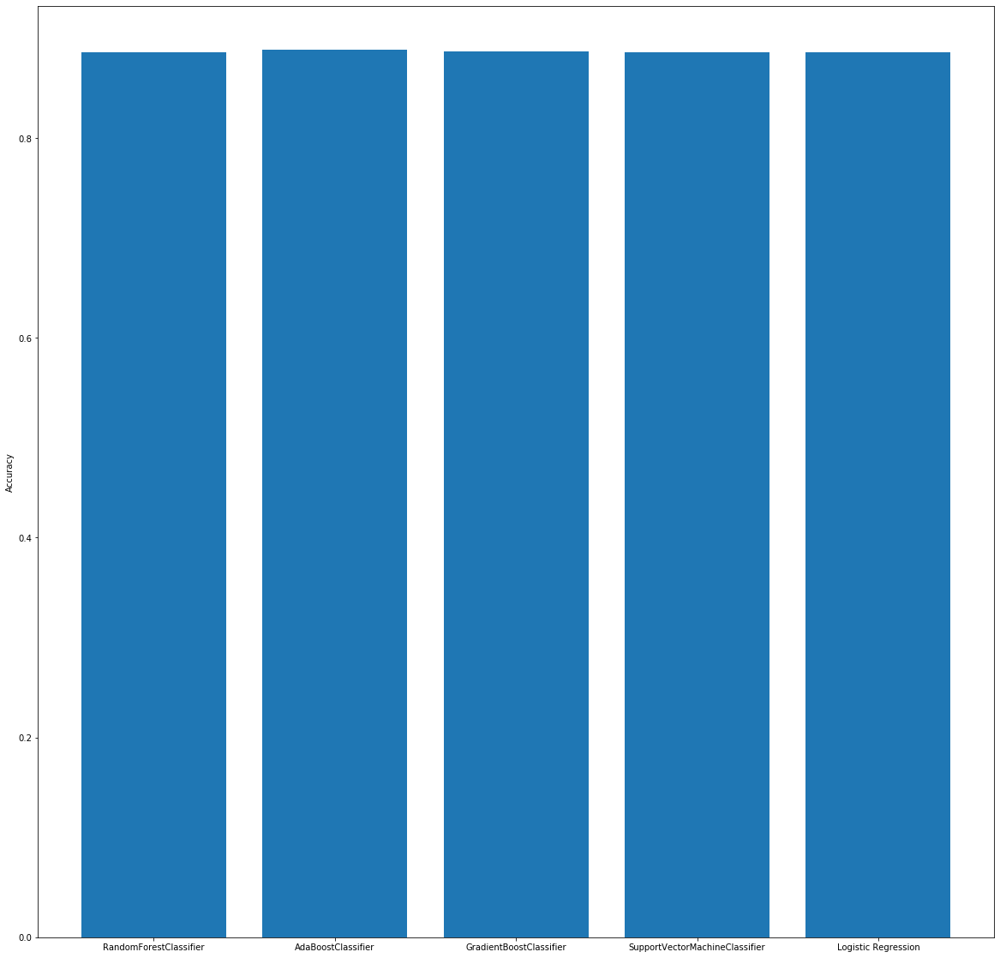

In [18]:
models = ['RandomForestClassifier', 'AdaBoostClassifier', 'GradientBoostClassifier', 'SupportVectorMachineClassifier', 'Logistic Regression']
fig, ax = plt.subplots(figsize=(20,20))
ax.set_ylabel('Accuracy')
ax.bar(models, accuracy_even)
for i in range(len(models)):
    print(models[i], accuracy_even[i])

## Accuracy for standard data split

RandomForestClassifier 0.948125
AdaBoostClassifier 0.931875
GradientBoostClassifier 0.969375
SupportVectorMachineClassifier 0.873125
Logistic Regression 0.898125


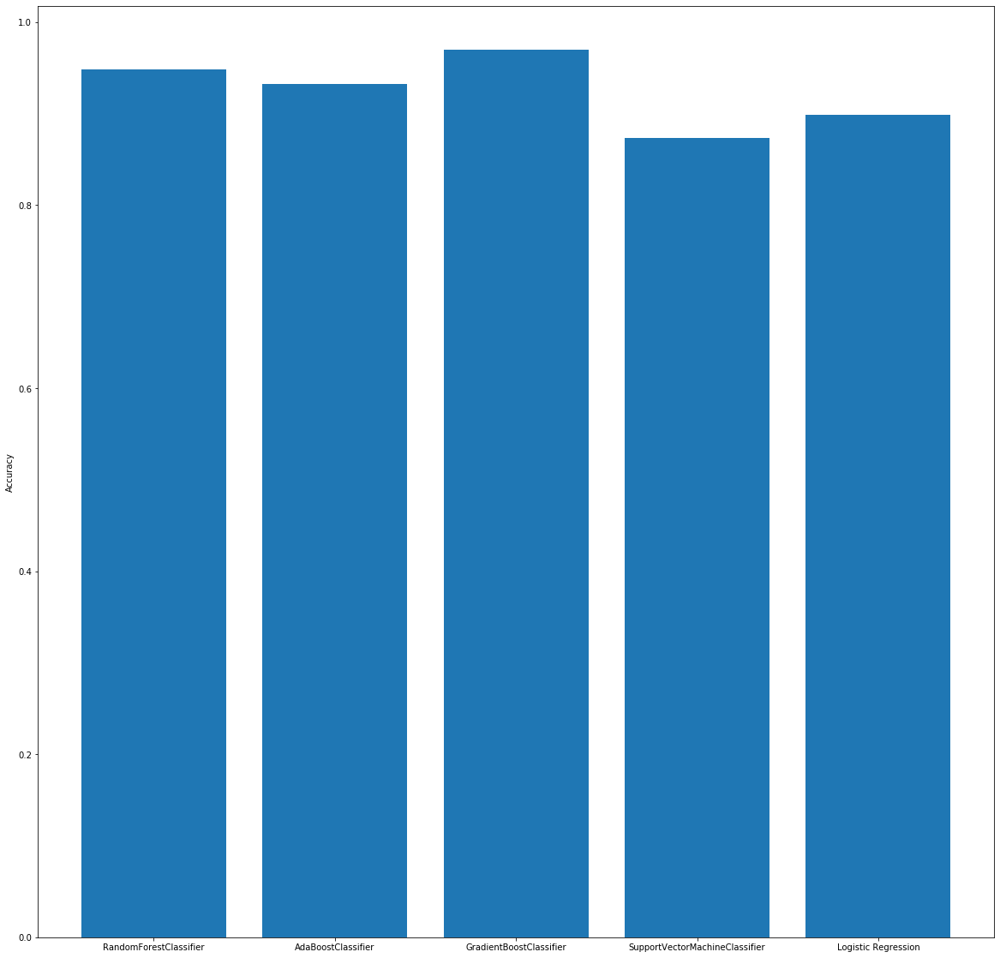

In [19]:
models = ['RandomForestClassifier', 'AdaBoostClassifier', 'GradientBoostClassifier', 'SupportVectorMachineClassifier', 'Logistic Regression']
fig, ax = plt.subplots(figsize=(20,20))
ax.set_ylabel('Accuracy')
ax.bar(models, accuracy_standard)
for i in range(len(models)):
    print(models[i], accuracy_standard[i])

In [20]:
print('CLASSIFIER SCORES WITH EVEN DATA DISTRIBUTION')
for each in predictors_even:
    print(each, each.score(X_train_even, y_train_even))

print('\nCLASSIFIER SCORES WITH TRAIN_TEST_SPLIT DATA DISTRIBUTION')
for each in predictors_standard:
    print(each, each.score(X_train_even, y_train_even))

CLASSIFIER SCORES WITH EVEN DATA DISTRIBUTION
RandomForestClassifier(max_depth=3, n_estimators=150, random_state=42) 0.8860225140712945
AdaBoostClassifier(n_estimators=25, random_state=42) 0.960287679799875
GradientBoostingClassifier(n_estimators=150, random_state=42) 0.9892120075046904
SVC(C=1, gamma=16, random_state=42) 0.9943714821763602
LogisticRegression(random_state=42) 0.9099437148217636

CLASSIFIER SCORES WITH TRAIN_TEST_SPLIT DATA DISTRIBUTION
RandomForestClassifier(max_depth=7, n_estimators=150, random_state=42) 0.9770168855534709
AdaBoostClassifier(n_estimators=25, random_state=42) 0.9462163852407754
GradientBoostingClassifier(max_depth=5, n_estimators=150, random_state=42) 0.9954659161976235
SVC(C=1, gamma=4, random_state=42) 0.967948717948718
LogisticRegression(random_state=42, solver='liblinear') 0.9055659787367104


In [21]:
print('CLASSIFIER SCORES WITH EVEN DATA DISTRIBUTION')
for each in predictors_even:
    print(each, each.score(X_test_even, y_test_even))

print('\nCLASSIFIER SCORES WITH TRAIN_TEST_SPLIT DATA DISTRIBUTION')
for each in predictors_standard:
    print(each, each.score(X_test_even, y_test_even))

CLASSIFIER SCORES WITH EVEN DATA DISTRIBUTION
RandomForestClassifier(max_depth=3, n_estimators=150, random_state=42) 0.885625
AdaBoostClassifier(n_estimators=25, random_state=42) 0.888125
GradientBoostingClassifier(n_estimators=150, random_state=42) 0.886875
SVC(C=1, gamma=16, random_state=42) 0.885625
LogisticRegression(random_state=42) 0.885625

CLASSIFIER SCORES WITH TRAIN_TEST_SPLIT DATA DISTRIBUTION
RandomForestClassifier(max_depth=7, n_estimators=150, random_state=42) 0.890625
AdaBoostClassifier(n_estimators=25, random_state=42) 0.889375
GradientBoostingClassifier(max_depth=5, n_estimators=150, random_state=42) 0.98375
SVC(C=1, gamma=4, random_state=42) 0.973125
LogisticRegression(random_state=42, solver='liblinear') 0.885625


Text(0, 0.5, 'Feature Importance')

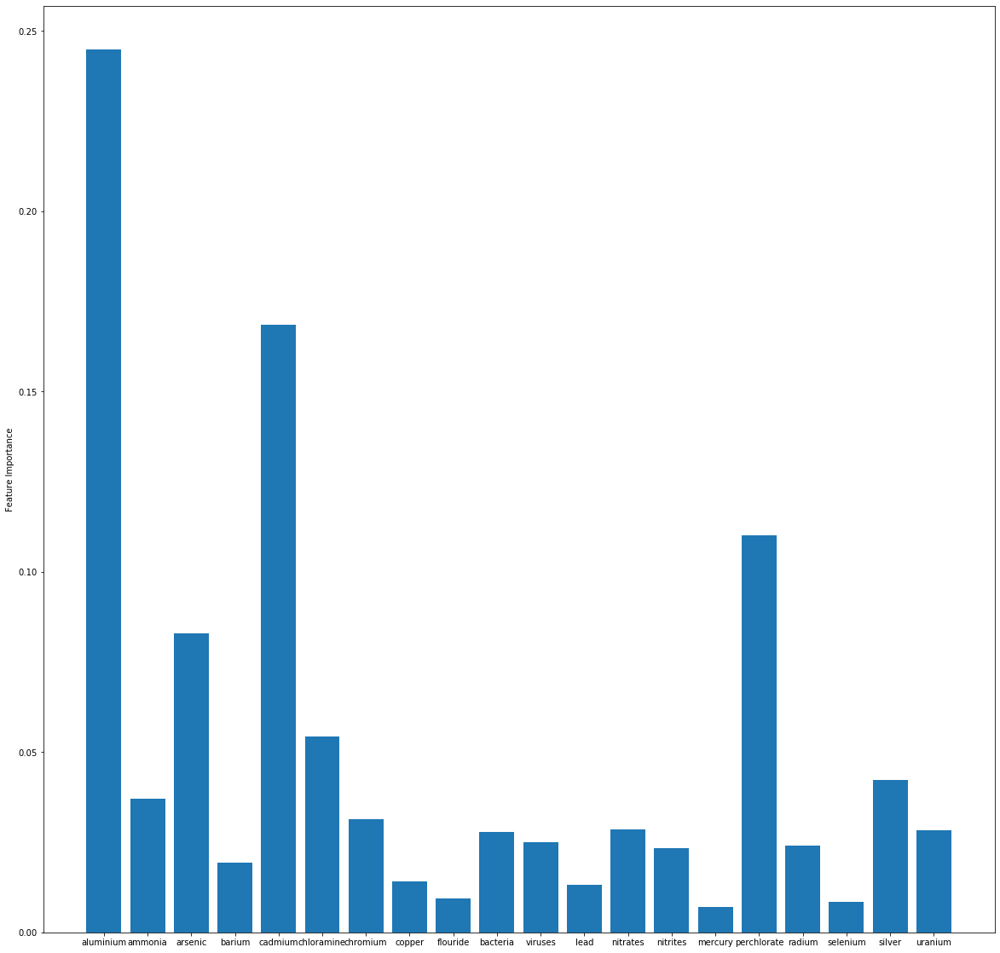

In [75]:
fig, ax = plt.subplots(figsize=(20,20))
ax.bar(X_train_standard.columns, rfc_gridcv_standard.best_estimator_.feature_importances_)
ax.set_ylabel('Feature Importance')

# Conclusion

### In the end, I have several classifiers with very strong scores of accuracy when prediction on training and test data.
### The Logistic Regression model is what I predicted to be the worst model and it was, but not my much.
### The AdaBoostClassifier was the best model on the training data, but did not perform as well on the test as the other models.
### Due to the fact that there was not much shared linearity among the data, I am not surprised that the SVC did very well.
### All of the models did very well on the data training and test, but I am surprised that the models performed very well on the train_test_split data vs the evenly split data. It is likely that the train_test_split function did a better job at shuffling the data than my even split.
### To conclude, the data from Kaggle provided different types of minerals, chemicals, and elements that can exist in water. These chemicals have a certain threshold for whether or not the water is drinkable. With these machine learning models, it is possible to determine whether the water is safe to drink.
### Going forward, due to the importance of a problem like this, I believe it would be essential to train on a much larger dataset with likely even more features. The reason being that this kind of problem is very important, but also very dangerous to get wrong. To be near absolutely certain is a must for this problem. That is why I think more data on this would be beneficial, especially since there were so many more 0s than 1s in this dataset.